# Assignment 16. Neural Network - 01

#### Dataset: forestfires.csv


In [1]:
# Importig Libraries
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score

In [2]:
# Loading dataset

data = pd.read_csv('Datasets/forestfires.csv')

### EDA & Data preprocessing

In [3]:
data.shape

(517, 31)

In [4]:
data.head()

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,small


In [5]:
data.sample(10)

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
369,sep,sun,91.0,276.3,825.1,7.1,13.8,77,7.6,0.0,...,0,0,0,0,0,0,0,0,1,small
507,aug,fri,91.0,166.9,752.6,7.1,25.9,41,3.6,0.0,...,0,0,0,0,0,0,0,0,0,small
74,sep,fri,93.3,141.2,713.9,13.9,27.6,30,1.3,0.0,...,0,0,0,0,0,0,0,0,1,small
252,aug,wed,93.1,157.3,666.7,13.5,22.1,37,3.6,0.0,...,0,0,0,0,0,0,0,0,0,small
234,sep,sat,92.5,121.1,674.4,8.6,17.7,25,3.1,0.0,...,0,0,0,0,0,0,0,0,1,large
73,aug,tue,88.8,147.3,614.5,9.0,17.3,43,4.5,0.0,...,0,0,0,0,0,0,0,0,0,small
24,aug,sat,93.5,139.4,594.2,20.3,23.7,32,5.8,0.0,...,0,0,0,0,0,0,0,0,0,small
278,dec,mon,85.4,25.4,349.7,2.6,4.6,21,8.5,0.0,...,0,0,0,0,0,0,0,0,0,large
376,aug,mon,92.1,207.0,672.6,8.2,21.1,54,2.2,0.0,...,0,0,0,0,0,0,0,0,0,small
10,sep,sat,92.5,88.0,698.6,7.1,17.8,51,7.2,0.0,...,0,0,0,0,0,0,0,0,1,small


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 31 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   month          517 non-null    object 
 1   day            517 non-null    object 
 2   FFMC           517 non-null    float64
 3   DMC            517 non-null    float64
 4   DC             517 non-null    float64
 5   ISI            517 non-null    float64
 6   temp           517 non-null    float64
 7   RH             517 non-null    int64  
 8   wind           517 non-null    float64
 9   rain           517 non-null    float64
 10  area           517 non-null    float64
 11  dayfri         517 non-null    int64  
 12  daymon         517 non-null    int64  
 13  daysat         517 non-null    int64  
 14  daysun         517 non-null    int64  
 15  daythu         517 non-null    int64  
 16  daytue         517 non-null    int64  
 17  daywed         517 non-null    int64  
 18  monthapr  

In [7]:
data.describe()

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthdec,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,...,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292,0.164410,...,0.017408,0.038685,0.003868,0.061896,0.032882,0.104449,0.003868,0.001934,0.029014,0.332689
std,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818,0.371006,...,0.130913,0.193029,0.062137,0.241199,0.178500,0.306138,0.062137,0.043980,0.168007,0.471632
min,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [8]:
data.isna().sum()

month            0
day              0
FFMC             0
DMC              0
DC               0
ISI              0
temp             0
RH               0
wind             0
rain             0
area             0
dayfri           0
daymon           0
daysat           0
daysun           0
daythu           0
daytue           0
daywed           0
monthapr         0
monthaug         0
monthdec         0
monthfeb         0
monthjan         0
monthjul         0
monthjun         0
monthmar         0
monthmay         0
monthnov         0
monthoct         0
monthsep         0
size_category    0
dtype: int64

In [9]:
# Dropping columns which are not required

data = data.drop(['dayfri', 'daymon', 'daysat', 'daysun', 'daythu','daytue', 'daywed', 'monthapr', 'monthaug', 'monthdec', 
                  'monthfeb','monthjan', 'monthjul', 'monthjun', 'monthmar', 'monthmay', 'monthnov','monthoct','monthsep'], 
                 axis = 1)
data

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.00,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.00,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.00,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.00,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.00,small
...,...,...,...,...,...,...,...,...,...,...,...,...
512,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44,large
513,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29,large
514,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16,large
515,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00,small


In [10]:
# Checking how much datapoints are having small and large area
data.size_category.value_counts()

small    378
large    139
Name: size_category, dtype: int64

<AxesSubplot:xlabel='size_category', ylabel='count'>

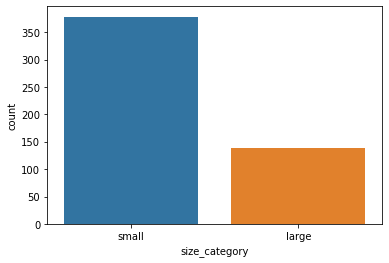

In [11]:
import seaborn as sns
sns.countplot(x = 'size_category', data = data)

In [12]:
# Checking for which value of area is categorised into large and small by creating crosstab between area and size_category
pd.crosstab(data.area, data.size_category)

size_category,large,small
area,,
0.00,0,247
0.09,0,1
0.17,0,1
0.21,0,1
0.24,0,1
...,...,...
200.94,1,0
212.88,1,0
278.53,1,0


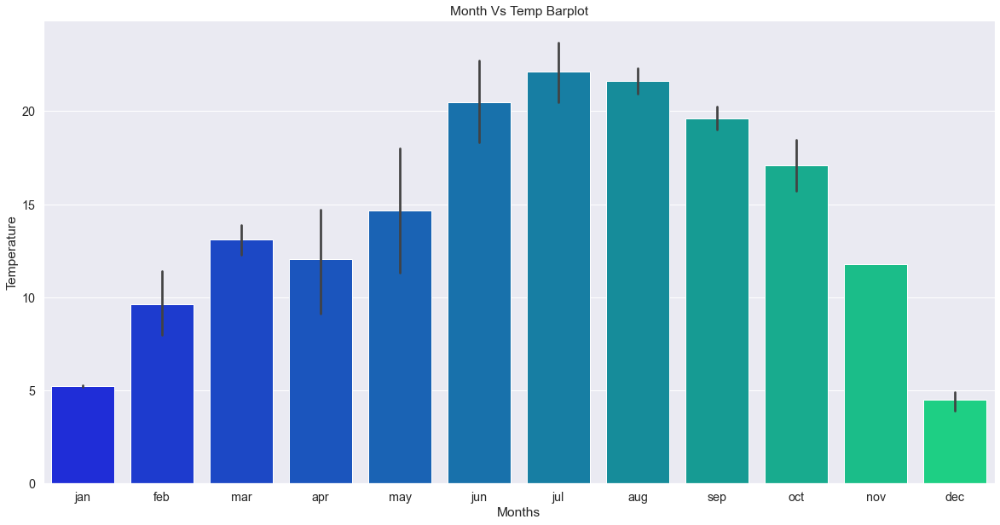

In [13]:
# Plotting Month Vs. temp plot
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [20, 10]
sns.set(style = "darkgrid", font_scale = 1.3)
month_temp = sns.barplot(x = 'month', y = 'temp', data = data,
                         order = ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec'], palette = 'winter');
month_temp.set(title = "Month Vs Temp Barplot", xlabel = "Months", ylabel = "Temperature");

C:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


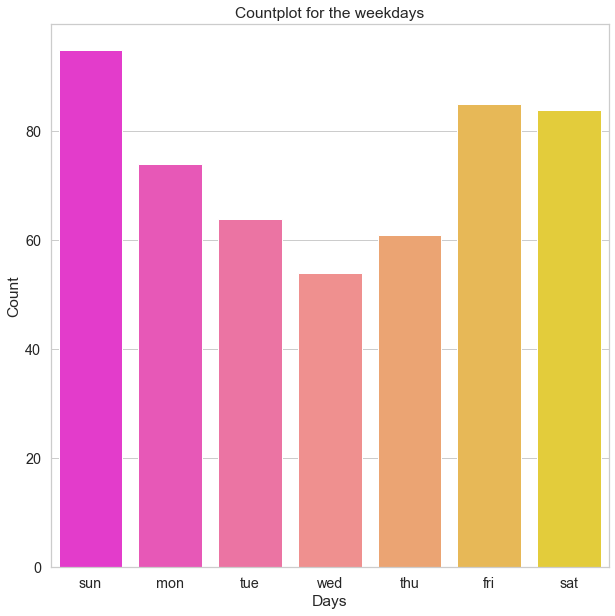

In [14]:
plt.rcParams['figure.figsize'] = [10, 10]
sns.set(style = 'whitegrid', font_scale = 1.3)
day = sns.countplot(data['day'], order = ['sun' ,'mon', 'tue', 'wed', 'thu', 'fri', 'sat'], palette = 'spring')
day.set(title = 'Countplot for the weekdays', xlabel = 'Days', ylabel = 'Count');

Text(0.5, 1.0, 'HeatMap of Features for the Classes')

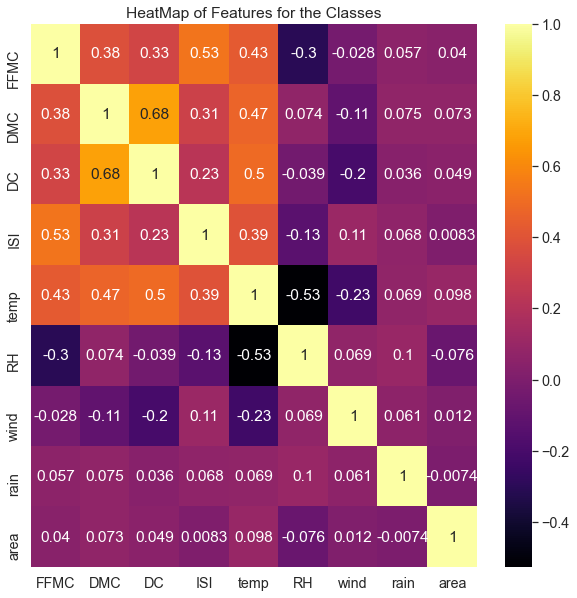

In [15]:
sns.heatmap(data.corr(), annot=True, cmap="inferno")
ax = plt.gca()
ax.set_title("HeatMap of Features for the Classes")

In [16]:
data.head()

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0,small


In [17]:
# Encoding month and day features

data.month.replace(('jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec'),
                           (1,2,3,4,5,6,7,8,9,10,11,12), inplace=True)
data.day.replace(('mon','tue','wed','thu','fri','sat','sun'),(1,2,3,4,5,6,7), inplace=True)
data.head()

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category
0,3,5,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0,small
1,10,2,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0,small
2,10,6,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0,small
3,3,5,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0,small
4,3,7,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0,small


In [18]:
# Encoding target variable 'size category'

data.size_category.replace(('small', 'large'), (0, 1), inplace = True)
data.sample(5)

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category
358,9,5,92.5,122.0,789.7,10.2,19.7,39,2.7,0.0,0.00,0
111,3,5,91.7,33.3,77.5,9.0,18.8,18,4.5,0.0,0.00,0
502,8,2,96.1,181.1,671.2,14.3,20.7,69,4.9,0.4,0.00,0
488,8,2,95.1,141.3,605.8,17.7,19.4,71,7.6,0.0,46.70,1
171,8,3,85.6,90.4,609.6,6.6,17.4,50,4.0,0.0,2.69,0


In [19]:
data.corr()['size_category'].sort_values(ascending=False)

size_category    1.000000
area             0.311322
month            0.080316
wind             0.059113
rain             0.050001
DMC              0.034715
FFMC             0.022063
DC               0.019428
day              0.016796
temp             0.006021
ISI             -0.008726
RH              -0.045243
Name: size_category, dtype: float64

In [20]:
# Standardizing data

from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

In [21]:
scaler.fit(data.drop('size_category',axis=1))

StandardScaler()

In [22]:
scaled_features=scaler.transform(data.drop('size_category',axis=1))
data_head=pd.DataFrame(scaled_features,columns=data.columns[:-1])
data_head

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,-1.968443,0.357721,-0.805959,-1.323326,-1.830477,-0.860946,-1.842640,0.411724,1.498614,-0.073268,-0.202020
1,1.110120,-1.090909,-0.008102,-1.179541,0.488891,-0.509688,-0.153278,-0.692456,-1.741756,-0.073268,-0.202020
2,1.110120,0.840597,-0.008102,-1.049822,0.560715,-0.509688,-0.739383,-0.692456,-1.518282,-0.073268,-0.202020
3,-1.968443,0.357721,0.191362,-1.212361,-1.898266,-0.004756,-1.825402,3.233519,-0.009834,0.603155,-0.202020
4,-1.968443,1.323474,-0.243833,-0.931043,-1.798600,0.126966,-1.291012,3.356206,-1.238940,-0.073268,-0.202020
...,...,...,...,...,...,...,...,...,...,...,...
512,0.230531,1.323474,-1.640083,-0.846648,0.474768,-1.563460,1.536084,-0.753800,-0.736124,-0.073268,-0.100753
513,0.230531,1.323474,-1.640083,-0.846648,0.474768,-1.563460,0.519019,1.638592,0.995798,-0.073268,0.651674
514,0.230531,1.323474,-1.640083,-0.846648,0.474768,-1.563460,0.398350,1.577248,1.498614,-0.073268,-0.026532
515,0.230531,0.840597,0.680957,0.549003,0.269382,0.500176,1.156839,-0.140366,-0.009834,-0.073268,-0.202020


In [23]:
# Splitting data into test data and train data

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(data_head,data['size_category'], test_size=0.3, random_state=42)

In [24]:
print('Shape of x_train: ', x_train.shape)
print('Shape of x_test: ', x_test.shape)
print('Shape of y_train: ', y_train.shape)
print('Shape of y_test: ', y_test.shape)

Shape of x_train:  (361, 11)
Shape of x_test:  (156, 11)
Shape of y_train:  (361,)
Shape of y_test:  (156,)


### Artificial Neural Network Model - Backpropagation

In [25]:
from keras.models import Sequential
from keras.layers import Dense

In [46]:
# create model
model = Sequential()
model.add(Dense(12, input_dim=11, kernel_initializer='uniform', activation='relu'))
model.add(Dense(10, kernel_initializer='uniform', activation='relu'))
model.add(Dense(1, kernel_initializer='uniform', activation='sigmoid'))

In [47]:
# Compile model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [48]:
# Fit the model
model.fit(x_train,y_train, epochs=100, batch_size=10)

Epoch 1/100
37/37 [==============================] - 1s 2ms/step - loss: 0.6896 - accuracy: 0.6953
Epoch 2/100
37/37 [==============================] - 0s 2ms/step - loss: 0.6758 - accuracy: 0.7285
Epoch 3/100
37/37 [==============================] - 0s 2ms/step - loss: 0.6514 - accuracy: 0.7285
Epoch 4/100
37/37 [==============================] - 0s 3ms/step - loss: 0.6074 - accuracy: 0.7313
Epoch 5/100
37/37 [==============================] - 0s 3ms/step - loss: 0.5633 - accuracy: 0.7368
Epoch 6/100
37/37 [==============================] - 0s 2ms/step - loss: 0.5293 - accuracy: 0.7562
Epoch 7/100
37/37 [==============================] - 0s 2ms/step - loss: 0.5025 - accuracy: 0.7645
Epoch 8/100
37/37 [==============================] - 0s 2ms/step - loss: 0.4745 - accuracy: 0.7729
Epoch 9/100
37/37 [==============================] - 0s 3ms/step - loss: 0.4454 - accuracy: 0.8089
Epoch 10/100
37/37 [==============================] - 0s 3ms/step - loss: 0.4143 - accuracy: 0.8144
Epoch 11/

37/37 [==============================] - 0s 2ms/step - loss: 0.0257 - accuracy: 0.9917
Epoch 83/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0247 - accuracy: 0.9945
Epoch 84/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0243 - accuracy: 0.9917
Epoch 85/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0251 - accuracy: 0.9972
Epoch 86/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0244 - accuracy: 0.9917
Epoch 87/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0248 - accuracy: 0.9917
Epoch 88/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0261 - accuracy: 0.9917
Epoch 89/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0244 - accuracy: 0.9945
Epoch 90/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0227 - accuracy: 0.9945
Epoch 91/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0226 - accuracy: 0.9972
Epoch 92/100


In [49]:
# evaluate the model
scores = model.evaluate(x_test, y_test)
print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

5/5 [==============================] - 0s 3ms/step - loss: 0.0537 - accuracy: 0.9808
accuracy: 98.08%


### Artificial Neural Network Model - Tuning of Hyperparameters batch size and epochs 

In [65]:
# Importing the necessary packages
from sklearn.model_selection import GridSearchCV, KFold
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.optimizers import adam_v2
from keras.layers import Dropout

In [60]:
# create model
def create_model():
    model = Sequential()
    model.add(Dense(12, input_dim=11, kernel_initializer='uniform', activation='relu'))
    model.add(Dense(8, kernel_initializer='uniform', activation='relu'))
    model.add(Dense(1, kernel_initializer='uniform', activation='sigmoid'))
    
    adam=adam_v2.Adam(learning_rate=0.01)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    return model

In [61]:
# Create the model
model = KerasClassifier(build_fn = create_model,verbose = 0)
# Define the grid search parameters
batch_size = [10,20,40]
epochs = [10,50,100]
# Make a dictionary of the grid search parameters
param_grid = dict(batch_size = batch_size,epochs = epochs)
# Build and fit the GridSearchCV
grid = GridSearchCV(estimator = model,param_grid = param_grid,cv = KFold(),verbose = 10)
grid_result = grid.fit(x_train, y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] batch_size=10, epochs=10 ........................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ............ batch_size=10, epochs=10, score=0.918, total=   1.6s
[CV] batch_size=10, epochs=10 ........................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s remaining:    0.0s


[CV] ............ batch_size=10, epochs=10, score=0.944, total=   1.6s
[CV] batch_size=10, epochs=10 ........................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    3.0s remaining:    0.0s


[CV] ............ batch_size=10, epochs=10, score=0.944, total=   1.8s
[CV] batch_size=10, epochs=10 ........................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.8s remaining:    0.0s


[CV] ............ batch_size=10, epochs=10, score=0.986, total=   1.4s
[CV] batch_size=10, epochs=10 ........................................


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    6.2s remaining:    0.0s


[CV] ............ batch_size=10, epochs=10, score=0.917, total=   1.5s
[CV] batch_size=10, epochs=50 ........................................


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    7.7s remaining:    0.0s


[CV] ............ batch_size=10, epochs=50, score=0.945, total=   2.8s
[CV] batch_size=10, epochs=50 ........................................


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:   10.5s remaining:    0.0s


[CV] ............ batch_size=10, epochs=50, score=0.958, total=   3.4s
[CV] batch_size=10, epochs=50 ........................................


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:   13.9s remaining:    0.0s


[CV] ............ batch_size=10, epochs=50, score=0.958, total=   3.1s
[CV] batch_size=10, epochs=50 ........................................


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:   17.0s remaining:    0.0s


[CV] ............ batch_size=10, epochs=50, score=0.986, total=   3.4s
[CV] batch_size=10, epochs=50 ........................................


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:   20.5s remaining:    0.0s


[CV] ............ batch_size=10, epochs=50, score=0.986, total=   3.2s
[CV] batch_size=10, epochs=100 .......................................
[CV] ........... batch_size=10, epochs=100, score=0.973, total=   4.5s
[CV] batch_size=10, epochs=100 .......................................
[CV] ........... batch_size=10, epochs=100, score=0.944, total=   4.8s
[CV] batch_size=10, epochs=100 .......................................
[CV] ........... batch_size=10, epochs=100, score=0.958, total=   5.4s
[CV] batch_size=10, epochs=100 .......................................
[CV] ........... batch_size=10, epochs=100, score=1.000, total=   5.2s
[CV] batch_size=10, epochs=100 .......................................
[CV] ........... batch_size=10, epochs=100, score=0.958, total=   4.9s
[CV] batch_size=20, epochs=10 ........................................
[CV] ............ batch_size=20, epochs=10, score=0.890, total=   1.3s
[CV] batch_size=20, epochs=10 ........................................
[CV] .

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:  1.7min finished


In [62]:
# Summarize the results
print('Best : {}, using {}'.format(grid_result.best_score_,grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
  print('{},{} with: {}'.format(mean, stdev, param))

Best : 0.9722983121871949, using {'batch_size': 40, 'epochs': 100}
0.9418949723243714,0.025237682236058438 with: {'batch_size': 10, 'epochs': 10}
0.9668188571929932,0.01646529613527316 with: {'batch_size': 10, 'epochs': 50}
0.966742753982544,0.018862856849520913 with: {'batch_size': 10, 'epochs': 100}
0.9114155292510986,0.03096874072814808 with: {'batch_size': 20, 'epochs': 10}
0.961187219619751,0.02696334962700205 with: {'batch_size': 20, 'epochs': 50}
0.9584094285964966,0.03170525501994146 with: {'batch_size': 20, 'epochs': 100}
0.7729832530021667,0.040866132890175426 with: {'batch_size': 40, 'epochs': 10}
0.9695966362953186,0.01822056088934547 with: {'batch_size': 40, 'epochs': 50}
0.9722983121871949,0.0001522064208984375 with: {'batch_size': 40, 'epochs': 100}


## Artificial Neural Network Model - Tuning of All Hyperparameters 

In [66]:
def create_model(learning_rate,dropout_rate,activation_function,init,neuron1,neuron2):
    model = Sequential()
    model.add(Dense(neuron1,input_dim = 11,kernel_initializer = init,activation = activation_function))
    model.add(Dropout(dropout_rate))
    model.add(Dense(neuron2,input_dim = neuron1,kernel_initializer = init,activation = activation_function))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1,activation = 'sigmoid'))
    
    adam=adam_v2.Adam(learning_rate = learning_rate)
    model.compile(loss = 'binary_crossentropy',optimizer = adam,metrics = ['accuracy'])
    return model

# Create the model

model = KerasClassifier(build_fn = create_model,verbose = 0)

# Define the grid search parameters

batch_size = [10,20,40]
epochs = [10,50,100]
learning_rate = [0.001,0.01,0.1]
dropout_rate = [0.0,0.1,0.2]
activation_function = ['softmax','relu','tanh','linear']
init = ['uniform','normal','zero']
neuron1 = [4,8,16]
neuron2 = [2,4,8]

# Make a dictionary of the grid search parameters

param_grids = dict(batch_size = batch_size,epochs = epochs,learning_rate = learning_rate,dropout_rate = dropout_rate,
                   activation_function = activation_function,init = init,neuron1 = neuron1,neuron2 = neuron2)

# Build and fit the GridSearchCV

grid = GridSearchCV(estimator = model,param_grid = param_grids,cv = KFold(),verbose = 10)
grid_result = grid.fit(x_train, y_train)

# Summarize the results
print('Best : {}, using {}'.format(grid_result.best_score_,grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
  print('{},{} with: {}'.format(mean, stdev, param))

Fitting 5 folds for each of 8748 candidates, totalling 43740 fits
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.726, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s remaining:    0.0s


[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   2.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    3.4s remaining:    0.0s


[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.8s remaining:    0.0s


[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    6.2s remaining:    0.0s


[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.764, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    7.7s remaining:    0.0s


[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.726, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    9.2s remaining:    0.0s


[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:   10.5s remaining:    0.0s


[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   1.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:   12.1s remaining:    0.0s


[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:   13.8s remaining:    0.0s


[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.764, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.681, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learnin

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.890, total=   2.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.903, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.833, total=   1.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.972, total=   1.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.806, total=   1.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.959, total=   1.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.875, total=   1.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.806, total=   1.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.944, total=   1.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, 

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.764, total=   1.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.726, total=   1.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   1.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.681, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   1.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.877, total=   2.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.917, total=   1.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.806, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   1.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.931, total=   1.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.959, total=   2.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.861, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.875, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.833, total=   1.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   2.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   1.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   2.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   4.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   3.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   3.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   4.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.726, total=   5.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   5.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   4.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   3.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.972, total=   3.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.959, total=   5.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.861, total=   9.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=  10.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=1.000, total=   5.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.931, total=   8.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.918, total=   7.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   3.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   4.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   4.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.764, total=   4.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   3.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   3.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.931, total=   3.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   4.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   4.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.945, total=   3.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.931, total=   3.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.958, total=   4.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   5.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.904, total=   3.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.889, total=   4.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   2.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   3.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.764, total=   2.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.726, total=   3.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   4.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.681, total=   4.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.764, total=   3.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.726, total=   3.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.736, total=   3.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.736, total=   4.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.764, total=   4.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.726, total=   4.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.681, total=   2.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.736, total=   2.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.764, total=   3.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.863, total=   6.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.889, total=   7.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.833, total=   7.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.986, total=   6.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.986, total=   7.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.959, total=   6.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.917, total=   8.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.903, total=   6.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.986, total=   7.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   7.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.959, total=   7.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.903, total=   7.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.903, total=   6.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.972, total=   7.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.917, total=   6.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.863, total=   7.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.903, total=   8.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.847, total=  11.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.986, total=   9.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.972, total=   9.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.945, total=   9.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=0.917, total=   8.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=0.917, total=   6.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=1.000, total=   8.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.931, total=   7.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.973, total=   7.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.958, total=   7.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   6.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   6.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.764, total=   7.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2, score=0.726, total=   7.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   7.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2, score=0.681, total=   6.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, 

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.736, total=   7.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.764, total=   7.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.726, total=   7.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.736, total=   6.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.681, total=   7.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.736, total=   7.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.726, total=   7.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.736, total=   6.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.681, total=   7.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   2.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.764, total=   1.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   1.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.681, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learnin

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.833, total=   2.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.795, total=   1.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.833, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.903, total=   2.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.944, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.875, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.932, total=   2.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.847, total=   2.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.806, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, 

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.764, total=   1.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.726, total=   2.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   2.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.681, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.833, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.822, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.875, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.903, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.833, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.778, total=   2.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   2.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.681, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.889, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   2.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.847, total=   2.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.932, total=   2.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.875, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.861, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.847, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.726, total=   4.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   4.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.0

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   4.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   4.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   4.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.958, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.972, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.986, total=   3.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.972, total=   3.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   3.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.875, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.972, total=   4.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=1.000, total=   5.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.764, total=   3.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.726, total=   3.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   3.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.681, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   4.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.764, total=   5.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   5.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.958, total=   4.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.944, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   4.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   6.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.973, total=   4.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   5.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=1.000, total=   4.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   4.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, 

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   5.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   5.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   4.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   4.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   5.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.726, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   4.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   4.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   4.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   3.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.932, total=   6.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   4.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.903, total=   6.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.847, total=   7.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.836, total=   7.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.972, total=  11.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.986, total=   7.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=1.000, total=   8.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   7.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.959, total=   8.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.958, total=   7.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learnin

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.944, total=   8.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=1.000, total=   7.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.931, total=   7.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.945, total=   8.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.875, total=   7.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.875, total=   8.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.875, total=   7.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.847, total=   7.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.849, total=   7.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.972, total=   6.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.986, total=   8.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=1.000, total=   7.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.944, total=   8.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=0.986, total=   6.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=0.931, total=   8.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.986, total=   8.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.931, total=   7.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.875, total=   8.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.822, total=   7.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   7.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   6.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.833, total=   8.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.833, total=   7.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2, score=0.726, total=   8.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neu

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.958, total=   7.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.972, total=   7.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   6.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.972, total=   7.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.973, total=   7.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.917, total=   8.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.986, total=   7.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.944, total=   8.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.959, total=   7.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   2.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.764, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learnin

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.681, total=   1.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.764, total=   2.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.808, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.889, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.917, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.819, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.836, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neu

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.726, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.694, total=   2.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.833, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.764, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.918, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.847, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.944, total=   2.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.806, total=   1.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.918, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.889, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.319, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.726, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.681, total=   2.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.764, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.795, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neu

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.944, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.875, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.726, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.847, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.833, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.833, total=   1.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, n

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   5.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   4.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   4.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=1.000, total=   3.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.958, total=   3.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   5.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.917, total=   3.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.944, total=   3.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.986, total=   3.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.903, total=   4.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.904, total=   4.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.917, total=   4.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.764, total=   6.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.726, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   4.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.681, total=   4.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   3.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.903, total=   3.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   3.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   3.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.917, total=   3.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   4.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, 

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.959, total=   3.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   3.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   4.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   3.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.764, total=   3.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   3.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.681, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   4.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.931, total=   4.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   4.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   4.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.932, total=   4.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   3.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   3.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.875, total=   3.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.932, total=   4.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   3.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.806, total=   7.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.861, total=   7.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.819, total=   7.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.986, total=   7.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.958, total=  11.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.986, total=   5.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=1.000, total=   7.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   7.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.973, total=   7.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   8.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.931, total=   7.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   8.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.931, total=   7.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.959, total=   7.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.889, total=   7.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.792, total=   7.2s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.847, total=   7.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.833, total=   7.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.973, total=   6.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.944, total=   8.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.972, total=   7.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=1.000, total=   7.5s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.972, total=   7.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=0.945, total=   8.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.903, total=   8.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.903, total=   6.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.931, total=   7.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.972, total=   7.6s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.726, total=   7.0s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   7.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuro

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   7.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   7.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   7.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuro

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.973, total=   7.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.958, total=   7.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.958, total=   7.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=1.000, total=   7.7s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.958, total=   9.3s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.959, total=   7.4s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1

[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.917, total=   7.9s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.986, total=   7.1s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.764, total=   8.8s
[CV] activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.726, total=   1.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   1.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.764, total=   1.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   1.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learnin

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   2.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.681, total=   2.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.764, total=   1.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.877, total=   3.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.917, total=   1.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neur

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuro

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.726, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.681, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   1.7s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.861, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.931, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.903, total=   1.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.875, total=   1.7s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.836, total=   1.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   1.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.681, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   1.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.726, total=   1.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.736, total=   1.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.764, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.726, total=   1.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.681, total=   1.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.764, total=   1.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.736, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.681, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.736, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   2.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   3.7s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   3.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.944, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=1.000, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.944, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.945, total=   3.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.889, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.861, total=   3.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.986, total=   2.7s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.958, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.959, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   2.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   2.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   2.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.726, total=   2.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   2.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   2.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   2.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.945, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.917, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.944, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, 

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.986, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.972, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.973, total=   2.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   2.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   2.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   2.7s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.681, total=   4.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.764, total=   3.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.726, total=   3.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   2.7s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.764, total=   2.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.726, total=   2.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.681, total=   2.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.736, total=   2.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.764, total=   4.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.726, total=   6.7s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.819, total=   5.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.681, total=   5.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.792, total=   3.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.819, total=   3.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.986, total=   3.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.917, total=   3.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.931, total=   3.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   3.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   3.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   3.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   3.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   4.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   5.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   4.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.808, total=   5.7s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   4.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.708, total=   4.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=1.000, total=   4.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.986, total=   4.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.959, total=   4.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.917, total=   5.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.931, total=   4.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.986, total=   3.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   7.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.945, total=   4.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.972, total=   5.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.861, total=   3.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.972, total=   3.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.875, total=   4.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   2.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   2.7s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   2.7s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   3.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.764, total=   2.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.726, total=   2.7s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.764, total=   2.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   3.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681, total=   3.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.726, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.264, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.764, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learnin

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.681, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.764, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.726, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.875, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neur

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.889, total=   1.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuro

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   1.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   1.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.726, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   1.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.681, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.889, total=   1.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.917, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.764, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.849, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   1.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.681, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.726, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.764, total=   1.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.726, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.931, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.875, total=   1.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.903, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.889, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.903, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   2.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.958, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=1.000, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.903, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.918, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.944, total=   2.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.931, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.917, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.931, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.918, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   2.5s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   2.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.726, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.944, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.944, total=   2.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.918, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.917, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, 

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=1.000, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.917, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.945, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.681, total=   2.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.917, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.973, total=   2.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.944, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.986, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.944, total=   2.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.932, total=   2.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.889, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.944, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.875, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.726, total=   3.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   3.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.681, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   3.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.986, total=   3.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.931, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   2.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.959, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   3.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   3.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   2.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   3.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   3.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=1.000, total=   2.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.958, total=   2.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.959, total=   2.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.903, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.944, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=1.000, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   2.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.945, total=   2.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.972, total=   3.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.944, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.931, total=   3.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.917, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   4.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   3.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=1.000, total=   2.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.986, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   3.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.958, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=1.000, total=   3.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.931, total=   3.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.958, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.917, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.986, total=   2.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.726, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.764, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learnin

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.681, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.764, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.904, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.875, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neur

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   1.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.847, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuro

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.726, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.681, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.917, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.918, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.931, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.917, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.875, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.836, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   1.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.681, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.726, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   1.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.764, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.726, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.903, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.889, total=   1.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.875, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.861, total=   1.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.833, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.903, total=   1.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.944, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=1.000, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.903, total=   2.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.932, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.903, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.917, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.903, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.931, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.986, total=   2.7s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.726, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   2.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.944, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.917, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.918, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.931, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.931, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, 

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.986, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.972, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.959, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   2.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.681, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.944, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.932, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.903, total=   2.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=1.000, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.889, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.973, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.819, total=   2.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.903, total=   2.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.861, total=   1.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.726, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.681, total=   2.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.932, total=   3.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.958, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   3.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=1.000, total=   2.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   3.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=1.000, total=   3.3s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.944, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=1.000, total=   2.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.958, total=   3.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.986, total=   3.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.958, total=   3.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.944, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=1.000, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.959, total=   3.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.8s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.903, total=   3.4s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.972, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.889, total=   3.0s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   3.6s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=1.000, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.986, total=   3.1s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.958, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.972, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.958, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1

[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.931, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.917, total=   2.9s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.958, total=   3.2s
[CV] activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.726, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.264, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.319, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.236, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learnin

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.681, total=   1.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.764, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.973, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neur

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.889, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuro

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.319, total=   1.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   1.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.726, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.681, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.903, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.932, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.847, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.972, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.917, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.877, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.681, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.726, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.736, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.764, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.726, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.681, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.736, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.764, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.681, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.736, total=   0.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.944, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=1.000, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.944, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.877, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.847, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.889, total=   1.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=1.000, total=   2.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.944, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.959, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.726, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.7s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.944, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.931, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.932, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.875, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.931, total=   2.2s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, 

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=1.000, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.944, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.973, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.8s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   1.7s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   2.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.681, total=   2.2s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.764, total=   1.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.726, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   1.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.726, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.681, total=   2.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.736, total=   1.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.726, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.681, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.973, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.889, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.931, total=   2.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.959, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.931, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.847, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   2.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=1.000, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.958, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.973, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.903, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.875, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.986, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.918, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.944, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.889, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.917, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.944, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.764, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.726, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.764, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   1.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.274, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.264, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.764, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learnin

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.681, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.764, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.726, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neur

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.806, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.875, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuro

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   1.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.2s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.264, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.236, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.274, total=   1.2s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.681, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.764, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.836, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.903, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.917, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.833, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.849, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.264, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.319, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.236, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.726, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.764, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.726, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.903, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.931, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.861, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.861, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.889, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.875, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   1.7s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.917, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.972, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.875, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.890, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.903, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.819, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.958, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.931, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.918, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.274, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.7s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.931, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.889, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.904, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.903, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.861, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, 

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.972, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.986, total=   1.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.932, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.681, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.903, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.932, total=   1.7s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.903, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=1.000, total=   1.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.917, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.861, total=   1.7s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.958, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.917, total=   2.2s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.726, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.681, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   2.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.986, total=   2.2s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   2.2s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.861, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.875, total=   2.2s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   2.2s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=1.000, total=   2.2s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.958, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.986, total=   2.2s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.917, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.972, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.972, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   2.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.973, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.958, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.931, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.917, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.958, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=1.000, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.944, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.973, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.931, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.958, total=   2.2s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.958, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.931, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.944, total=   2.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=1.000, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.726, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.236, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.274, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learnin

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.681, total=   1.2s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.764, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.726, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neur

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.792, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.861, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.847, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuro

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.726, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.681, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.847, total=   1.2s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.836, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.903, total=   1.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.917, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.764, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.795, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.319, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   1.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.726, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.736, total=   1.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.764, total=   1.2s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.726, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.819, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.875, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.861, total=   1.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.833, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.833, total=   1.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.903, total=   1.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.875, total=   1.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.958, total=   1.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.861, total=   1.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.890, total=   1.7s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.903, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.833, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.875, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.889, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.904, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.264, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.726, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.875, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.958, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.861, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.890, total=   1.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.889, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.806, total=   1.7s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, 

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.986, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.917, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.918, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   1.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.681, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.861, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.904, total=   1.7s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.917, total=   1.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=1.000, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.958, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.932, total=   1.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.847, total=   1.7s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.889, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.889, total=   1.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.726, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.681, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   2.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.973, total=   2.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learni

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   2.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.750, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.973, total=   2.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   2.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   2.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   2.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rat

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=1.000, total=   2.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.931, total=   2.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.959, total=   2.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01,

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.944, total=   2.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.917, total=   2.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=1.000, total=   2.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   2.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.918, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.903, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.931, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.931, total=   2.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.931, total=   2.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   2.9s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   2.6s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=1.000, total=   2.5s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.931, total=   2.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.959, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, ne

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.931, total=   2.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.972, total=   2.4s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.944, total=   2.3s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1

[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.931, total=   4.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.917, total=   3.1s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=1.000, total=   3.0s
[CV] activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.726, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.750, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.781, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.806, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.917, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.945, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.958, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.917, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.736, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.944, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.736, total=   1.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.726, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.681, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.806, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.726, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.931, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, sco

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=1.000, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.917, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.973, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, s

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.944, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.889, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.890,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.889, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.917, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.958, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.764, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.726, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.736, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.681, total=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.764, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.726, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.736,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.764, total=   1.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.726, total=   1.3s

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.917, total=   5.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.806, total=   5.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.958, total=   5.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.932, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.931, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.972, total=   2.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   3.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   3.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   3.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=1.000, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.972, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.726, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.944, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=1.000, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.958, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.903, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.847, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=1.000, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=1.000, total=   3.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.917, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.944, total=   3.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.958, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.945, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.958, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.945, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.889,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.972, total=   3.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.972, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.972, total=   3.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   3.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   3.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   3.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.726, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.736, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.681, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.736, total=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.764, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.726, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.736, total=   3.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.681,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.764, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.726, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.736, total=   2.4s

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.944, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=1.000, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.972, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.986, total=   6.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.958, total=   5.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.958, total=   6.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   5.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.945, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.972, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.972, total=   3.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.986, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.959, total=   6.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.958, total=   4.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.944, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, ne

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.986, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.904, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.958, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.958, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=1.000, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.972, total=   4.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.958, total=   4.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   4.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.918, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   4.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   4.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.931, total=   4.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.959, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.958, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   4.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   4.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   4.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.764, total=   5.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.726,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   4.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   4.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   4.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   4.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681, total=   4.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.764, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.726, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.764, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.681, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.875, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.833, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.875, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.958, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.726, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.889, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.944, total=   1.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.764, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.795, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.750, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.833, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.806, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.932, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.903, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.958, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, sco

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.931, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.681, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.931, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.861,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.808, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.792, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.875, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.764, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.726, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.736, total=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.764, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.726,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.764, total=   1.8s

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.836, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.931, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.875, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.861, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.973, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.944, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   2.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.681, total=   2.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   3.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.764, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.986, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.681, total=   2.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.736, total=   2.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.932, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.903, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.958, total=   2.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.944, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.973, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.958, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, sco

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=1.000, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.959, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, s

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.861, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.944, total=   3.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.973,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.847, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.681, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.736, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   2.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.764, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.726, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.736, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.681, total=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   3.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.764, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.726, total=   3.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.736,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.764, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.726, total=   3.5s

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.958, total=   4.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.972, total=   4.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   4.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.972, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.986, total=   4.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.972, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   4.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   4.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.764, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.726, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.972, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.764, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.932, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.778, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=1.000, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.944, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.959, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.958, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.958, total=   4.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=1.000, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.973, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   4.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.958, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.875, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.959, total=   4.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.806, total=   4.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.808, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   4.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   4.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   4.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   4.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.764,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   4.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   4.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681, total=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.750, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.764, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.726, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.681, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.792, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.681, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.904, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.681, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.819, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.877, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.736, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.764, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.726, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.681, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.778, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.778, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.958, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.931, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.958, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.726, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.931, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.750, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.736,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.806, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.726, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.806, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.764, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.726, total=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.764,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   1.4s

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.875, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.918, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.889, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=1.000, total=   2.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.958, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.932, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.681, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.944, total=   3.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.833, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.681, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.726, total=   2.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.736, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.681, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.861, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.945, total=   2.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.903, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=1.000, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.944, total=   2.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.973, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=1.000, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.903, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, sco

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.889, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.736, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.986, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.819, total=   2.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.861, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   3.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.764, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.726, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.736, total=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.764, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.726,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.764, total=   2.6s

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.890, total=   4.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.931, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.958, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=1.000, total=   4.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.986, total=   4.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.973, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.931, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.958, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   4.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   4.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.726, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.986, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.726, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuro

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.972, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=1.000, total=   4.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.972, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.973, total=   4.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.958, total=   4.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.986, total=   4.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.917, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=1.000, total=   4.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.736, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.889, total=   4.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.932, total=   4.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.681, total=   4.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   4.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.806, total=   4.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   4.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   5.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   4.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   5.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   4.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   4.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   5.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   4.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   4.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   6.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   6.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   6.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   2.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.681, total=   2.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.778, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.849, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.944, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.681, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.931, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.726, total=   2.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.958, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, sco

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.877, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, s

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.764, total=   2.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.750, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.681, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.750, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.959, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.931, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.944, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.945, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.917, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.944,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.736, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.863, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.764, total=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681, total=   1.4s

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.875, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.836, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.806, total=   3.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=1.000, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.847, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   2.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.958, total=   3.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.986, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   3.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.972, total=   2.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.986, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.973, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.931, total=   3.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.958, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.847, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.863, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.903, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.958, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.861, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   2.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.958, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   2.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.836, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.958, total=   3.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   3.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   2.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.764, total=   3.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.726, total=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.764,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.8s

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.764, total=   3.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.890, total=   5.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.958, total=   4.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.944, total=   4.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=1.000, total=   5.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.944, total=   4.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.726, total=   3.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.931, total=   3.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.681, total=   3.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   3.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.944, total=   3.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.973, total=   4.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   3.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=1.000, total=   4.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.986, total=   4.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.986, total=   3.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.931, total=   3.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=1.000, total=   3.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.944, total=   3.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.973, total=   4.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.972, total=   4.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   4.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   4.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.932, total=   4.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   4.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   4.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.944, total=   3.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   3.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.681, total=   3.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   5.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   4.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   3.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   3.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   4.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   3.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   3.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   3.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   4.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   4.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   5.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   4.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   6.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.750, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.753, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.681, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.764, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.890, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.875, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.903, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.890, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.889, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.889, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, sco

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   2.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.740, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.681, total=   2.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.861, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.890, total=   2.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.917, total=   2.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.944, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.889, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.932, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.903,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.875, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.833, total=   2.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   1.7s

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.889, total=   2.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   2.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.764, total=   2.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.903, total=   3.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.847, total=   3.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.903, total=   2.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   2.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.681, total=   3.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   3.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.986, total=   3.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.944, total=   2.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, sco

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   3.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   3.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.945, total=   2.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, s

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.806, total=   3.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   2.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.847, total=   4.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.931, total=   4.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.903, total=   3.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.958, total=   2.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.973, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   3.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   2.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.889, total=   2.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.959, total=   3.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.944, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.944,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   3.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.945, total=   4.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   5.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   3.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   2.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   3.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.764, total=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   3.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681, total=   2.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   3.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681, total=   3.1s

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.958, total=   5.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.861, total=   4.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.986, total=   4.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.972, total=   4.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.944, total=   4.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=1.000, total=   4.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   4.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   4.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   4.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   4.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   4.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   4.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   4.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   4.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   4.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.932, total=   3.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.931, total=   3.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.903, total=   2.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=1.000, total=   2.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.944, total=   2.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.973, total=   2.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.931, total=   3.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   2.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   3.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.903, total=   5.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   5.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.736, total=   5.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   3.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.736, total=   5.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   7.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   4.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   5.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   4.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   7.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   3.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   3.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   4.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   4.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   4.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   3.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   3.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   3.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.726, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.778, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.726, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.750, total=   2.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.903, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.917, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.849, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.903, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.944, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.847, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.847, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.806, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.778, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.726, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.847, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.890, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.903, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.944, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.764, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.795,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.889, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.847, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.2s

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.847, total=   2.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   2.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.875, total=   2.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.890, total=   2.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.958, total=   2.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.889, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.958, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.726, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   2.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   3.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=1.000, total=   2.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.986, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   3.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, sco

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.903, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.904, total=   3.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.903, total=   2.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.917, total=   3.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   3.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   3.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   3.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.944, total=   2.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.959, total=   2.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.917,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   3.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   3.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   4.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   3.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   3.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   2.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   3.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   2.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   2.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.6s

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   4.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   4.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.861, total=   4.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.986, total=   7.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.958, total=   4.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.917, total=   4.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   4.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.958, total=   3.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.945, total=   4.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   6.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   8.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   8.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.973, total=   3.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   3.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   3.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.958, total=   4.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.945, total=   8.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.931, total=   6.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=1.000, total=   6.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.944, total=   6.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.986, total=   6.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   3.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   3.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   4.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   3.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.931, total=   3.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   3.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.877, total=   2.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   5.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   3.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   5.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   4.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   5.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   5.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   3.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   4.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   3.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   3.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   3.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   3.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   2.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.726, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.781, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.764, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.833, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.819, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.795, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.778, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.847, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.847, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.753, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.764, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.847, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.822, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.889, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.959,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.889, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.931, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.736, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.0s

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.792, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.847, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.986, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.931, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.972, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.945, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.986, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, sco

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.792, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.819, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.836, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.861, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.806, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.945, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.931, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.932, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.917,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   1.4s

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.833, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.932, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.944, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.889, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.958, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.944, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.945, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.889, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.806, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.822, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.889, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.972, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.903, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.945, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.944, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.863, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.931, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.726, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.726, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.736, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.833, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.726, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.861, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.875, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.861, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.767, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.726, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.861, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.819, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.795, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.903, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.903, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.877,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.0s

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.836, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.847, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.681, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.944, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.726, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.986, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, sco

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.847, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.778, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.861, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.822, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.861, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.806, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.889, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.959, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=1.000, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.931, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.0s

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.764, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.890, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.917, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.889, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.972, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.904, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.819, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.822, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.917, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.958, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.861, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.918, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.736, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.973, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.726, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.726, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.806, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.764, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.795, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.806, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.931, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.847, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.889, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.875, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.726, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.833, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.808, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.847, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.833, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.836,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.792, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.875, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.2s

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.819, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.959, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.792, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.889, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.931, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.944, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   3.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.944, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.726, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   3.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, sco

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.778, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.836, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.833, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.778, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.944, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   1.5s

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.917, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.931, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.764, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.959, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.903, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.889, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.986, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.847, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.945, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.819, total=   3.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.958, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.847, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.945, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.973, total=   4.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.736, total=   3.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.767, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.750, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.708, total=   1.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.819, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.808, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.792, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.944, total=   1.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.918, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.944, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.931, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   1.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.986, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.781, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.764, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.722, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.819, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.822, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.833, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.931, total=   1.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.932, total=   1.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   1.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.918,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   1.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.2s

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.931, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.917, total=   2.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.972, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.986, total=   2.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.972, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.986, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   2.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   2.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.932, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.986, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, sco

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.958, total=   2.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.958, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=1.000, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.973, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.972, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.986, total=   2.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.944, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.959, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.917,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   2.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=1.000, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.889, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   2.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.8s

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.986, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=1.000, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.972, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=1.000, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.972, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.986, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.931, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.973, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.986, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.986, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.972, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=1.000, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.972, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.986, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.944, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   3.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.903, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.918, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.931, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   3.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   4.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   4.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   4.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.767, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.750, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.708, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.819, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.781, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.792, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.903, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.959, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.931, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.781, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.764, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.722, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.819, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.822, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.819, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.903, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.889, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.819, total=   1.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.4s

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.931, total=   3.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.917, total=   3.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.958, total=   3.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.986, total=   3.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.958, total=   3.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.972, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.958, total=   3.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   3.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   3.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.973, total=   4.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   4.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.986, total=   3.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   3.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, sco

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.958, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.958, total=   4.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=1.000, total=   4.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.973, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.972, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.986, total=   3.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.973, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.861, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=1.000, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.889, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.5s

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.986, total=   4.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=1.000, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.986, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=1.000, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.972, total=   4.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.986, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   4.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.932, total=   4.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   4.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   4.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.986, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.986, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.972, total=   4.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=1.000, total=   4.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.986, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.973, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.944, total=   4.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.931, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.959, total=   4.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   4.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   4.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   4.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   4.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   5.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.767, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.750, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.819, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.795, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.764, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.972, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.917, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.944, total=   2.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.903, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.767, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.764, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.708, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.819, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.808, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.792, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   2.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.917, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.973, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.931, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.875, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.833, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.781,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.875, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.764, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   4.0s

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.917, total=   6.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.917, total=   5.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.958, total=   4.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.973, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.958, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.958, total=   3.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.931, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.958, total=   3.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   3.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.973, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   3.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   4.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, sco

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.958, total=   5.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.958, total=   7.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=1.000, total=   7.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=1.000, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.944, total=   3.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.986, total=   3.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=1.000, total=   3.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   3.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   3.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   3.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.959, total=   3.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.944,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   3.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   3.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   3.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   3.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   3.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   2.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   3.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.7s

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.972, total=   6.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=1.000, total=   6.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.958, total=   5.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.986, total=   4.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.972, total=   4.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.972, total=   4.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   4.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.972, total=   5.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   4.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   5.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   6.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   6.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.959, total=   6.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   6.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   7.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.972, total=   4.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.986, total=   4.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.972, total=   4.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=1.000, total=   6.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.972, total=   5.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.986, total=   6.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   4.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   4.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   4.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.944, total=   4.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   4.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   4.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.877, total=   4.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.931, total=   4.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   6.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   4.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   7.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   6.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   4.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   4.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   4.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   4.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   4.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   4.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   5.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   6.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.753, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.792, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.781, total=   3.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.778, total=   2.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.972, total=   4.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.931, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   4.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   3.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   3.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   1.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.861, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.767, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.750, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.806, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.781, total=   4.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   4.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   3.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.944, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   1.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.931, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.931, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.904,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.8s

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.889, total=   4.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.833, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.917, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.918, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.931, total=   3.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.917, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   2.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   3.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.973, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.986, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, sco

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.931, total=   3.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.875, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.958, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.945, total=   3.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.958, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.958, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   2.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.958, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.959, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.944,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=1.000, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   3.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   3.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   3.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.5s

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.944, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=1.000, total=   4.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.917, total=   3.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=1.000, total=   3.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.958, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.986, total=   4.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   4.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.944, total=   3.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.959, total=   4.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   4.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   3.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.944, total=   3.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=1.000, total=   3.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.958, total=   4.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=1.000, total=   4.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.986, total=   4.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=1.000, total=   3.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   4.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   6.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   3.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   3.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   4.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.890, total=   4.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   5.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   4.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   4.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   4.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   4.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   3.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   3.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   4.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   4.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.753, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.750, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.806, total=   2.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.767, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.750, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.958, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.889, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.944, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   3.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.750, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.708, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.806, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.781, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.778, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.917, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.959, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.944, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.903, total=   2.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.932,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.819, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.875, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   2.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.5s

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.847, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.847, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.917, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.904, total=   3.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.931, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.903, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   3.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   3.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.958, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.973, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.986, total=   3.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, sco

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.903, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.875, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.944, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.945, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.944, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.944, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.973, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   4.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   3.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.959, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   3.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   3.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   3.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   4.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   3.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   3.1s

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.931, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=1.000, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.889, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=1.000, total=   4.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.944, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.972, total=   4.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   5.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.944, total=   5.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   4.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   4.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.944, total=   4.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.973, total=   5.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   4.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   4.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.958, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=1.000, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.958, total=   5.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=1.000, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.986, total=   6.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=1.000, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   4.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   4.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.944, total=   5.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   6.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   5.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   4.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.931, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   4.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   5.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   4.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   4.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   4.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   4.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   4.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   5.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   4.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.753, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.750, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.792, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.767, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.750, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.972, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.889, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.959, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.931, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.740, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.792, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.767, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.903, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.945, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.847, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.889, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.932,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.931, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.2s

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.875, total=   3.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.833, total=   3.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.917, total=   2.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.904, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.903, total=   3.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.861, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.944, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.932, total=   3.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=1.000, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, sco

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.917, total=   3.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.889, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.944, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.945, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.931, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.931, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.973, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   3.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.973, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.944,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   3.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   3.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   2.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   3.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.9s

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.931, total=   4.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.986, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.889, total=   6.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.986, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.958, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.986, total=   4.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   4.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   4.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   6.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   5.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.945, total=   4.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   5.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.931, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.986, total=   4.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.958, total=   4.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=1.000, total=   4.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.972, total=   4.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.973, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   4.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   4.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   4.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   4.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.945, total=   4.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   5.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   5.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   5.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   4.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   4.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   6.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   4.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.726, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.778, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.767, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.750, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.944, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.847, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.877, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.875, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.917, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.740, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.795, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.944, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.875, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.904, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.931, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.861, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.945,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.875, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.2s

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.792, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.806, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.822, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.847, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.792, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.972, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.959, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=1.000, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, sco

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.861, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.806, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.861, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.863, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.917, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.847, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.959, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.931, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   4.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   3.0s

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.833, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.917, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.833, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.945, total=   3.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.931, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.931, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   4.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.959, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   3.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.847, total=   3.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.918, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.931, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=1.000, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.931, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.986, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.945, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   3.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   3.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   3.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.726, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.778, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.767, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.750, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.931, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.847, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.863, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.903, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.944, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.917, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.875, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.767, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.750, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.944, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.847, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.945, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.903, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.890,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.931, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.847, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.931, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   2.0s

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.792, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.750, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.833, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.836, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.889, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.806, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.917, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.973, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.958, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.973, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, sco

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.833, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.819, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.861, total=   3.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.877, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.931, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.847, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.959, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.931, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=1.000, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=1.000, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.0s

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.847, total=   3.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.931, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.833, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.945, total=   3.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.931, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.931, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   3.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.973, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.847, total=   3.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.918, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.931, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=1.000, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.903, total=   4.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.973, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.931, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   3.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.932, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   4.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   3.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   4.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.726, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.778, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.767, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.750, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.944, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.833, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.849, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.889, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.847, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.792, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.767, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.750, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.931, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.833, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.918, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.861, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.932,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.917, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.3s

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.792, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.833, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.836, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.847, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.819, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.959, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=1.000, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, sco

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.847, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.792, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.847, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.863, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.889, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.847, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.959, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.903, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.973, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=1.000, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.0s

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.847, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.931, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.833, total=   3.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.945, total=   4.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.931, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.861, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, 

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.959, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.945, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.847, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.890, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.931, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=1.000, total=   3.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.917, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.973, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   3.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   4.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   3.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   3.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   3.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   4.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   3.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   3.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   3.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   3.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.767, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.750, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.708, total=   2.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.833, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.819, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.808, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.0

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.958, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.972, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   2.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.944, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, 

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.903, total=   2.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.958, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.931, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.767, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.750, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.708, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.819, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.806, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.822, total=   1.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, 

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.917, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.944, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.931, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.959, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.931, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   2.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=1.000, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuro

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.764, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.681, total=   2.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.726, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.736, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.681, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.764, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.726, total=   2.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.736, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.681,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.736, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.764, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.726, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.958, total=   5.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.958, total=   4.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=1.000, total=   4.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.958, total=   4.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.986, total=   4.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.972, total=   3.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.972, total=   4.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=1.000, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.986, total=   3.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, 

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.973, total=   4.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.972, total=   4.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.986, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=1.000, total=   3.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.958, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.890, total=   4.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.958, total=   3.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.972, total=   3.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=1.000, total=   4.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.986, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.973, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.958, total=   5.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=1.000, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=0.972, total=   3.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   4.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.986, total=   3.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=1.000, total=   6.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.944, total=   3.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   4.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   4.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   3.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   4.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   4.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.681, total=   3.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.764, total=   4.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.726, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   4.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.764, total=   3.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.726, total=   3.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.681, total=   3.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.736, total=   3.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.764, total=   4.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=1.000, total=   6.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.972, total=   6.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.986, total=   6.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=1.000, total=   4.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.986, total=   4.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.973, total=   4.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   7.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.875, total=   7.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   6.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   7.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=1.000, total=   6.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   6.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, 

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.986, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.972, total=   6.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.986, total=   5.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=1.000, total=   6.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.958, total=   8.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=1.000, total=   6.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.972, total=   6.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.972, total=   6.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=1.000, total=   6.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, 

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   4.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.973, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.972, total=   6.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.986, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=1.000, total=   6.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.972, total=   4.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   7.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.726, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.736, total=   7.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.681, total=   7.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.764, total=   6.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.726, total=   6.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.736, total=   6.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.764, total=   7.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.726, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.708, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.764, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.806, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.822, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.778, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.958, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.973, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.944, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.944, total=   2.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.972, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.904, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.944, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.958, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.778, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.792, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.767, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.819, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.792, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.847, total=   2.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, 

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.973, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   2.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.958, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   2.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   2.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.931, total=   2.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.959, total=   2.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.944, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.861, total=   4.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.945, total=   4.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.958, total=   4.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.958, total=   3.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=1.000, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.958, total=   3.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.945, total=   4.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   4.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   4.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   6.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neu

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.986, total=   4.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   4.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   3.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.861, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.959, total=   3.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.944, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.972, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=1.000, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.958, total=   4.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, 

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   4.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   4.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=1.000, total=   4.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.931, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.973, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.986, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=1.000, total=   4.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.931, total=   4.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.681, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   4.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.726, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   6.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.681, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.764, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.726, total=   4.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   3.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.736, total=   2.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.764, total=   3.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.726, total=   2.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.681, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.736, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.764, total=   4.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.986, total=   6.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.972, total=   6.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.986, total=   7.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=1.000, total=   6.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.944, total=   6.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   7.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.972, total=   6.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.972, total=   6.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=1.000, total=   6.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.986, total=   7.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.973, total=   6.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.972, total=   6.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.972, total=   6.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=1.000, total=   7.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.958, total=   8.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.986, total=   7.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.972, total=   6.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.986, total=   7.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   7.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   6.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   7.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   7.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   6.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   6.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, 

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.959, total=   8.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   6.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   7.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   6.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.764, total=   6.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   7.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.681, total=   7.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   6.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=  11.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   7.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.681, total=   6.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   6.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.726, total=   6.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.736, total=   6.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.681, total=   6.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.764, total=   6.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.726, total=   7.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.736, total=   6.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.708, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.778, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.806, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.918, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.944, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.944, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=1.000, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.931, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.973, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neu

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.889, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.750, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.986, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.903, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.708, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.778, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.806, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.959, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.931, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.958, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.931, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=0.959, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=0.958, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.917, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.917, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.932, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2, score=0.681, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.726, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   2.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.681, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.764, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.726, total=   2.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.68

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.736, total=   2.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.764, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.726, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=0.944, total=   4.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=1.000, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=0.917, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=1.000, total=   4.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.972, total=   6.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.986, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=1.000, total=   3.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.944, total=   3.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   3.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.973, total=   4.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   3.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.958, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.875, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.945, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.958, total=   3.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.972, total=   3.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=1.000, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.959, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.972, total=   3.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.986, total=   3.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   3.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.973, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.972, total=   3.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=1.000, total=   3.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.986, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.726, total=   4.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   3.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.736, total=   3.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.681, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.736, total=   3.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.726, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.736, total=   3.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.681, total=   5.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.764, total=   3.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.726, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.736, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.681,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=1.000, total=   4.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.972, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=1.000, total=   5.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.972, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.986, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=1.000, total=   5.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   5.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   5.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.972, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.944, total=   5.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=1.000, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.972, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.973, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.972, total=   5.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.972, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, 

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=1.000, total=   5.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.986, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=1.000, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.958, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.986, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=1.000, total=   5.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   4.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.973, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   5.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   4.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.931, total=   5.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=1.000, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   5.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.681, total=   4.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   4.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   4.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   5.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.726, total=   6.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   6.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   7.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.764, total=   6.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.767, total=   2.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.708, total=   1.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.806, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.945, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.958, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.958, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.972, total=   4.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.958, total=   2.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.959, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, 

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.903, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.944, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.917, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.792, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.753, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.750, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.708, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.778, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, 

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.890, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.944, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.917, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.917, total=   2.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.973, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.889, total=   1.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.726, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   2.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.681, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.764, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.726, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.736, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.764, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.726, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.736,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.681, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.736, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.764, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.890, total=   3.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.931, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.889, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=1.000, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.986, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.973, total=   3.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.972, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.986, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.972, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, 

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.973, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.972, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.972, total=   2.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=1.000, total=   3.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.972, total=   2.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.932, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.931, total=   3.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.917, total=   2.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=1.000, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.986, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   3.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=0.986, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=1.000, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=0.986, total=   3.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.972, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.972, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=1.000, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.726, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   2.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   3.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2, score=0.764, total=   2.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.726, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   3.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.764, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.726, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.681, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.764, total=   2.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.726,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.736, total=   3.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.681, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.736, total=   2.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=0.972, total=   3.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.986, total=   4.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.944, total=   3.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.986, total=   4.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=1.000, total=   4.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.958, total=   3.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   3.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   3.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   3.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=1.000, total=   3.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.958, total=   3.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   4.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   4.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   4.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=1.000, total=   3.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, 

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.931, total=   4.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=1.000, total=   3.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.972, total=   3.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.972, total=   3.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=1.000, total=   4.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.986, total=   4.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=1.000, total=   4.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.944, total=   4.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.986, total=   3.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, 

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=1.000, total=   4.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   3.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.959, total=   3.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.972, total=   4.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.972, total=   4.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=1.000, total=   6.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   3.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   4.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   3.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.764, total=   3.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.726, total=   3.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.736, total=   4.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   4.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.764, total=   3.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.726, total=   3.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681, total=   3.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   3.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.764, total=   4.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.750, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.764, total=   2.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.778, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.781, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   3.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.931, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.931, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.959, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.944, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.944, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.903, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.973, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.917, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.764, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.778, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.781, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.708, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, 

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.917, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.959, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.903, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.917, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.959, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   2.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.836, total=   2.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.875, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.806, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.958, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.875, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.904, total=   3.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.0

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.972, total=   3.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.972, total=   4.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   3.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, 

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.931, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=1.000, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.958, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.849, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.875, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.833, total=   3.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.944, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.847, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.918, total=   2.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, 

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.986, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.958, total=   3.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.986, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=1.000, total=   3.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuro

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   3.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.764, total=   2.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   3.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.681, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.726, total=   3.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.736, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.681, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.764, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.726, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.736, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.681,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.764, total=   2.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.726, total=   3.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.944, total=   4.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.972, total=   4.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=1.000, total=   4.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.986, total=   5.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=1.000, total=   3.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.972, total=   3.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.972, total=   5.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=1.000, total=   4.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.986, total=   4.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=1.000, total=   5.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.972, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.986, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=1.000, total=   4.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.986, total=   4.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.945, total=   4.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.958, total=   4.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.986, total=   4.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=1.000, total=   5.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.986, total=   3.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   3.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.972, total=   4.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=0.986, total=   3.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=1.000, total=   3.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=0.958, total=   4.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, 

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.986, total=   3.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.972, total=   3.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.972, total=   3.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   4.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.764, total=   5.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.726, total=   7.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2, score=0.681, total=   3.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2, score=0.764, total=   3.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   4.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.681, total=   4.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   4.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.726, total=   3.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.736, total=   3.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.681, total=   4.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.764, total=   4.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.726, total=   4.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.736, total=   4.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   2.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=0.764, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=0.778, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.781, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.778, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.708, total=   2.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   2.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.917, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.918, total=   2.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.931, total=   2.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.889, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.904, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   1.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.931, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.778, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.753, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.931, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.875, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.931, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.890, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.931, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.931, total=   2.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.903, total=   1.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.890, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.903, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.944, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.861, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.726, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.681, total=   2.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   2.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.736, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.681, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.736, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.726, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.736, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.681, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.764, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.726, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.736, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.681,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.917, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.833, total=   3.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=0.863, total=   3.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.931, total=   3.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.931, total=   2.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.958, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   2.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.973, total=   2.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   2.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.944, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=1.000, total=   3.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.986, total=   3.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.972, total=   3.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.986, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=1.000, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.847, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.849, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.889, total=   4.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.931, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=1.000, total=   3.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.889, total=   3.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.944, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.972, total=   3.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=1.000, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   3.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.932, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.958, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   3.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   2.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   2.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.764, total=   1.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681, total=   2.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   2.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   2.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.889, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.973, total=   2.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.944, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.972, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=1.000, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.958, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   3.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   2.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   3.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.986, total=   3.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, 

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.958, total=   3.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.917, total=   3.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.959, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.972, total=   2.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.986, total=   3.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=1.000, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.958, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   3.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.958, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=1.000, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.972, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.973, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.972, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=1.000, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.986, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.726, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.681, total=   3.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.736, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.726, total=   3.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.681, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.736, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.764, total=   2.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.736, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.681, total=   3.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.736, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.726, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.736, total=   2.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.681, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.750, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.778, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.740, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.889, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.833, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.917, total=   1.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.847, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.945, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.917, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.944, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.958, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.903, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.726, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.778, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.767, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.903, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.833, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.917, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=0.861, total=   1.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.877, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.917, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=1.000, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.972, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.918, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.681, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.764, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.681, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.726, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.681, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.764, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.726, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.736, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.681,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.736, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.764, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.726, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.819, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.792, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.833, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.847, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.973, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.972, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neur

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=1.000, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=1.000, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuro

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.932, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.944, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=1.000, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.972, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.986, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.861, total=   1.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.806, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.861, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.986, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.986, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.972, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=1.000, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.986, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=0.986, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.972, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=1.000, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.972, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2, score=0.726, total=   1.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2, score=0.736, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2, score=0.681, total=   1.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.764, total=   1.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.726, total=   2.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score=0.736, total=   1.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2, score

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.736, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.764, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=0.726, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2, score=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.681, total=   1.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.736, total=   1.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.764, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.72

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=0.931, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=0.917, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=0.958, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.944, total=   2.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.986, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8, score=0.972, total=   2.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   2.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   2.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   2.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=1.000, total=   3.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.986, total=   3.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=1.000, total=   4.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.903, total=   4.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.833, total=   2.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.944, total=   3.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.958, total=   2.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.986, total=   4.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.972, total=   4.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neur

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   2.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=1.000, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   2.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuro

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.973, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   2.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=1.000, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.944, total=   3.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.986, total=   3.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.681, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.736, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.726, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.681, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.764, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.726, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.764, total=   1.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.726, total=   1.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.681, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.750, total=   1.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.764, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.767, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.750, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.694, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.931, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.847, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.849, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.903, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.944, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.973, total=   1.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   2.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.931, total=   1.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.750, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.764, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.750, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.667, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.750, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.833, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.863, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.889, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.958, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.986, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.889, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.917, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.903, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.986, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.726, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.681, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.726, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, sco

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.736, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8, score=0.764, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.726, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, s

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.681, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.736, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8, score=0.764, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.726,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.736, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.681, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.736, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4, score=0.833, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.849, total=   1.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.889, total=   1.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.944, total=   2.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=1.000, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4, score=0.986, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.986, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.958, total=   2.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.986, total=   3.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=1.000, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2, score=0.931, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.973, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.778, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.750, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.792, total=   1.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8, score=0.847, total=   2.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.836, total=   2.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.861, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   2.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   2.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8, score=0.972, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   2.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4, score=0.958, total=   3.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.973, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.944, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.736, total=   2.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4, score=0.764, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.681, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   2.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.681, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.726, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.736, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.681, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.736,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2, score=0.764, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.726, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.736, total=   3.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.847, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.931, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2, score=0.847, total=   4.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.986, total=   3.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.972, total=   2.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2, score=0.972, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=1.000, total=   3.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8, score=0.986, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2, score=0.973, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.972, total=   3.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=0.986, total=   3.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8, score=1.000, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4, score=0.903, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=1.000, total=   2.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8, score=0.972, total=   2.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.931, total=   2.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.958, total=   3.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4, score=0.847, total=   3.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.986, total=   2.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.972, total=   3.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4, score=0.986, total=   2.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=1.000, total=   3.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2, score=0.986, total=   3.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4, score=1.000, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.972, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=0.958, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2, score=1.000, total=   3.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.917, total=   3.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.726, total=   5.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2, score=0.736, total=   3.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   3.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.764, total=   3.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2, score=0.726, total=   3.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.681, total=   3.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.736, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.764, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.736, total=   3.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.681, total=   2.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8, score=0.736, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.726, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.736, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score=0.681, total=   2.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8, score

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.764, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.694, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.863, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.903, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4, score=0.847, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.972, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.889, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4, score=0.973, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.889, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.972, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.903, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.740, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2, score=0.681, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.764, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.778, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2, score=0.836, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.847, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.958, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8, score=0.847, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.944, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8, score=0.958, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.685, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.931, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8, score=0.875, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.764, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.726, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8, score=0.736, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.736, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score=0.764, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score=0.726, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8, score

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.681, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.736, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4, score=0.764, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.681, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.736, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4, score=0.764,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.822, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.806, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4, score=0.764, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.889, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2, score=0.819, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4, score=0.849, total=   1.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.972, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2, score=1.000, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.958, total=   1.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.973, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2, score=0.972, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=1.000, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8, score=0.972, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2, score=0.932, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.819, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.806, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8, score=0.861, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4, score=0.847, total=   1.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.863, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8, score=0.889, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=1.000, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4, score=0.986, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.973, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.972, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4, score=0.986, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2, score=0.958, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.986, total=   2.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4, score=0.958, total=   3.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.736, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2, score=0.764, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4, score=0.726, total=   1.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.681, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2, score=0.764, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4, score

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   2.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.681, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2, score=0.736, total=   2.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.726, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.681, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2, score=0.736,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8, score=0.764, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.849, total=   2.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2, score=0.889, total=   3.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.00

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.931, total=   2.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.972, total=   3.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8, score=0.903, total=   5.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rat

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=1.000, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.972, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8, score=0.986, total=   5.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=1.000, total=   3.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4, score=0.972, total=   3.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8, score=0.986, total=   2.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.958, total=   3.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=0.986, total=   3.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4, score=1.000, total=   3.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2, score=0.847, total=   2.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.863, total=   2.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4, score=0.903, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001,

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.875, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.958, total=   2.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2, score=0.861, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   2.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.958, total=   2.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2, score=0.986, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=1.000, total=   2.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8, score=0.972, total=   2.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2, score=0.986, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.986, total=   2.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=1.000, total=   2.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8, score=0.917, total=   2.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.726, total=   2.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.736, total=   3.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8, score=0.681, total=   3.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.736, total=   2.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4, score=0.764, total=   2.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8, score=0.726, total=   2.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.681, total=   2.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.736, total=   1.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4, score=0.764, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.736, total=   2.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.681, total=   2.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score=0.736, total=   1.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4, score

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.726, total=   1.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.736, total=   1.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4, score=0.681, total=   2.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4

[Parallel(n_jobs=1)]: Done 43740 out of 43740 | elapsed: 1996.4min finished


Best : 0.9916666626930237, using {'activation_function': 'tanh', 'batch_size': 20, 'dropout_rate': 0.1, 'epochs': 50, 'init': 'normal', 'learning_rate': 0.01, 'neuron1': 4, 'neuron2': 2}
0.7285388112068176,0.027103524979390985 with: {'activation_function': 'softmax', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 10, 'init': 'uniform', 'learning_rate': 0.001, 'neuron1': 4, 'neuron2': 2}
0.7285388112068176,0.027103524979390985 with: {'activation_function': 'softmax', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 10, 'init': 'uniform', 'learning_rate': 0.001, 'neuron1': 4, 'neuron2': 4}
0.7285388112068176,0.027103524979390985 with: {'activation_function': 'softmax', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 10, 'init': 'uniform', 'learning_rate': 0.001, 'neuron1': 4, 'neuron2': 8}
0.7285388112068176,0.027103524979390985 with: {'activation_function': 'softmax', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 10, 'init': 'uniform', 'learning_rate': 0.001, 'neuron1': 8, 'neuron

0.8974505305290222,0.03697447875656873 with: {'activation_function': 'softmax', 'batch_size': 20, 'dropout_rate': 0.1, 'epochs': 50, 'init': 'normal', 'learning_rate': 0.1, 'neuron1': 16, 'neuron2': 4}
0.9279299855232239,0.029745507519319318 with: {'activation_function': 'softmax', 'batch_size': 20, 'dropout_rate': 0.1, 'epochs': 50, 'init': 'normal', 'learning_rate': 0.1, 'neuron1': 16, 'neuron2': 8}
0.7285388112068176,0.027103524979390985 with: {'activation_function': 'softmax', 'batch_size': 20, 'dropout_rate': 0.1, 'epochs': 50, 'init': 'zero', 'learning_rate': 0.001, 'neuron1': 4, 'neuron2': 2}
0.7285388112068176,0.027103524979390985 with: {'activation_function': 'softmax', 'batch_size': 20, 'dropout_rate': 0.1, 'epochs': 50, 'init': 'zero', 'learning_rate': 0.001, 'neuron1': 4, 'neuron2': 4}
0.7285388112068176,0.027103524979390985 with: {'activation_function': 'softmax', 'batch_size': 20, 'dropout_rate': 0.1, 'epochs': 50, 'init': 'zero', 'learning_rate': 0.001, 'neuron1': 4, 'ne

0.8282724499702454,0.036752667639437325 with: {'activation_function': 'softmax', 'batch_size': 40, 'dropout_rate': 0.2, 'epochs': 10, 'init': 'normal', 'learning_rate': 0.1, 'neuron1': 8, 'neuron2': 4}
0.855936062335968,0.007148668999476591 with: {'activation_function': 'softmax', 'batch_size': 40, 'dropout_rate': 0.2, 'epochs': 10, 'init': 'normal', 'learning_rate': 0.1, 'neuron1': 8, 'neuron2': 8}
0.8531963467597962,0.051631420131615355 with: {'activation_function': 'softmax', 'batch_size': 40, 'dropout_rate': 0.2, 'epochs': 10, 'init': 'normal', 'learning_rate': 0.1, 'neuron1': 16, 'neuron2': 2}
0.8227930068969727,0.03162866190064661 with: {'activation_function': 'softmax', 'batch_size': 40, 'dropout_rate': 0.2, 'epochs': 10, 'init': 'normal', 'learning_rate': 0.1, 'neuron1': 16, 'neuron2': 4}
0.8503805160522461,0.03229528790387778 with: {'activation_function': 'softmax', 'batch_size': 40, 'dropout_rate': 0.2, 'epochs': 10, 'init': 'normal', 'learning_rate': 0.1, 'neuron1': 16, 'neu

0.9611491680145263,0.03770491602136734 with: {'activation_function': 'relu', 'batch_size': 10, 'dropout_rate': 0.2, 'epochs': 50, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 4, 'neuron2': 8}
0.9084474802017212,0.11545287024455425 with: {'activation_function': 'relu', 'batch_size': 10, 'dropout_rate': 0.2, 'epochs': 50, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 8, 'neuron2': 2}
0.9723363637924194,0.019562310541944593 with: {'activation_function': 'relu', 'batch_size': 10, 'dropout_rate': 0.2, 'epochs': 50, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 8, 'neuron2': 4}
0.9667047142982483,0.025788865716467775 with: {'activation_function': 'relu', 'batch_size': 10, 'dropout_rate': 0.2, 'epochs': 50, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 8, 'neuron2': 8}
0.9167427539825439,0.09048475349860415 with: {'activation_function': 'relu', 'batch_size': 10, 'dropout_rate': 0.2, 'epochs': 50, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 16, 'neuron2': 

0.9668188571929932,0.01866190087411785 with: {'activation_function': 'relu', 'batch_size': 40, 'dropout_rate': 0.0, 'epochs': 50, 'init': 'normal', 'learning_rate': 0.01, 'neuron1': 8, 'neuron2': 2}
0.9722602605819702,0.017598438876482943 with: {'activation_function': 'relu', 'batch_size': 40, 'dropout_rate': 0.0, 'epochs': 50, 'init': 'normal', 'learning_rate': 0.01, 'neuron1': 8, 'neuron2': 4}
0.9695966362953186,0.01822056088934547 with: {'activation_function': 'relu', 'batch_size': 40, 'dropout_rate': 0.0, 'epochs': 50, 'init': 'normal', 'learning_rate': 0.01, 'neuron1': 8, 'neuron2': 8}
0.9223744153976441,0.09488820094651886 with: {'activation_function': 'relu', 'batch_size': 40, 'dropout_rate': 0.0, 'epochs': 50, 'init': 'normal', 'learning_rate': 0.01, 'neuron1': 16, 'neuron2': 2}
0.9639649748802185,0.0208180386144778 with: {'activation_function': 'relu', 'batch_size': 40, 'dropout_rate': 0.0, 'epochs': 50, 'init': 'normal', 'learning_rate': 0.01, 'neuron1': 16, 'neuron2': 4}
0.9

0.9888888835906983,0.010393497697042267 with: {'activation_function': 'tanh', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'normal', 'learning_rate': 0.001, 'neuron1': 8, 'neuron2': 2}
0.983371376991272,0.01040394079109783 with: {'activation_function': 'tanh', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'normal', 'learning_rate': 0.001, 'neuron1': 8, 'neuron2': 4}
0.9888888835906983,0.010393497697042267 with: {'activation_function': 'tanh', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'normal', 'learning_rate': 0.001, 'neuron1': 8, 'neuron2': 8}
0.9861491560935974,0.00878443846308914 with: {'activation_function': 'tanh', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'normal', 'learning_rate': 0.001, 'neuron1': 16, 'neuron2': 2}
0.983371376991272,0.01040394079109783 with: {'activation_function': 'tanh', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'normal', 'learning_rate': 0.001, 'neuron1': 16, 'neuron

0.7285388112068176,0.027103524979390985 with: {'activation_function': 'tanh', 'batch_size': 20, 'dropout_rate': 0.0, 'epochs': 50, 'init': 'zero', 'learning_rate': 0.1, 'neuron1': 16, 'neuron2': 8}
0.9501521944999695,0.02718716853087946 with: {'activation_function': 'tanh', 'batch_size': 20, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'uniform', 'learning_rate': 0.001, 'neuron1': 4, 'neuron2': 2}
0.9750380396842957,0.016223357005681806 with: {'activation_function': 'tanh', 'batch_size': 20, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'uniform', 'learning_rate': 0.001, 'neuron1': 4, 'neuron2': 4}
0.9805935978889465,0.014179071294977894 with: {'activation_function': 'tanh', 'batch_size': 20, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'uniform', 'learning_rate': 0.001, 'neuron1': 4, 'neuron2': 8}
0.9695205330848694,0.016210857220224834 with: {'activation_function': 'tanh', 'batch_size': 20, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'uniform', 'learning_rate': 0.001, 'neuron1': 8, 'neur

0.9141552448272705,0.02682671320163828 with: {'activation_function': 'tanh', 'batch_size': 40, 'dropout_rate': 0.1, 'epochs': 10, 'init': 'normal', 'learning_rate': 0.1, 'neuron1': 8, 'neuron2': 4}
0.9308219075202941,0.028883395655858596 with: {'activation_function': 'tanh', 'batch_size': 40, 'dropout_rate': 0.1, 'epochs': 10, 'init': 'normal', 'learning_rate': 0.1, 'neuron1': 8, 'neuron2': 8}
0.9140791654586792,0.020570702314827473 with: {'activation_function': 'tanh', 'batch_size': 40, 'dropout_rate': 0.1, 'epochs': 10, 'init': 'normal', 'learning_rate': 0.1, 'neuron1': 16, 'neuron2': 2}
0.900190269947052,0.037835513975449854 with: {'activation_function': 'tanh', 'batch_size': 40, 'dropout_rate': 0.1, 'epochs': 10, 'init': 'normal', 'learning_rate': 0.1, 'neuron1': 16, 'neuron2': 4}
0.903006088733673,0.03837446937906585 with: {'activation_function': 'tanh', 'batch_size': 40, 'dropout_rate': 0.1, 'epochs': 10, 'init': 'normal', 'learning_rate': 0.1, 'neuron1': 16, 'neuron2': 8}
0.7285

0.9472602725028991,0.03668184081313677 with: {'activation_function': 'linear', 'batch_size': 10, 'dropout_rate': 0.2, 'epochs': 10, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 4, 'neuron2': 8}
0.9417808175086975,0.0406828166485089 with: {'activation_function': 'linear', 'batch_size': 10, 'dropout_rate': 0.2, 'epochs': 10, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 8, 'neuron2': 2}
0.9639649868011475,0.018874039519877032 with: {'activation_function': 'linear', 'batch_size': 10, 'dropout_rate': 0.2, 'epochs': 10, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 8, 'neuron2': 4}
0.9611491680145263,0.028361537601957275 with: {'activation_function': 'linear', 'batch_size': 10, 'dropout_rate': 0.2, 'epochs': 10, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 8, 'neuron2': 8}
0.9584094285964966,0.02488817030413995 with: {'activation_function': 'linear', 'batch_size': 10, 'dropout_rate': 0.2, 'epochs': 10, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 16, 'n

0.9778538703918457,0.014134887705190795 with: {'activation_function': 'linear', 'batch_size': 20, 'dropout_rate': 0.2, 'epochs': 100, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 8, 'neuron2': 4}
0.9805935978889465,0.014179071294977894 with: {'activation_function': 'linear', 'batch_size': 20, 'dropout_rate': 0.2, 'epochs': 100, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 8, 'neuron2': 8}
0.9861111044883728,0.012422605798556053 with: {'activation_function': 'linear', 'batch_size': 20, 'dropout_rate': 0.2, 'epochs': 100, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 16, 'neuron2': 2}
0.9806697010993958,0.01398556580119099 with: {'activation_function': 'linear', 'batch_size': 20, 'dropout_rate': 0.2, 'epochs': 100, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 16, 'neuron2': 4}
0.9888888835906983,0.010393497697042267 with: {'activation_function': 'linear', 'batch_size': 20, 'dropout_rate': 0.2, 'epochs': 100, 'init': 'uniform', 'learning_rate': 0.01, 'neuron

#### Best : 0.9916666626930237, using {'activation_function': 'tanh', 'batch_size': 20, 'dropout_rate': 0.1, 'epochs': 50, 'init': 'normal', 'learning_rate': 0.01, 'neuron1': 4, 'neuron2': 2}

### Building final model with above best parameters obtained from tuning hyper paramters

In [67]:
# create model
final_model = Sequential()
final_model.add(Dense(4,input_dim = 11,kernel_initializer = 'normal',activation = 'tanh'))
final_model.add(Dropout(0.1))
final_model.add(Dense(2,input_dim = 4,kernel_initializer = 'normal',activation = 'tanh'))
final_model.add(Dropout(0.1))
final_model.add(Dense(1,activation = 'sigmoid'))
    
adam=adam_v2.Adam(learning_rate = 0.01)


In [68]:
# Compile Model
final_model.compile(loss = 'binary_crossentropy',optimizer = adam,metrics = ['accuracy'])

In [69]:
# Fit the model
final_model.fit(x_train,y_train, epochs=50, batch_size=20)

Epoch 1/50
19/19 [==============================] - 1s 2ms/step - loss: 0.6608 - accuracy: 0.7313
Epoch 2/50
19/19 [==============================] - 0s 3ms/step - loss: 0.5760 - accuracy: 0.7479
Epoch 3/50
19/19 [==============================] - 0s 2ms/step - loss: 0.5257 - accuracy: 0.7701
Epoch 4/50
19/19 [==============================] - 0s 2ms/step - loss: 0.4672 - accuracy: 0.8033
Epoch 5/50
19/19 [==============================] - 0s 3ms/step - loss: 0.4389 - accuracy: 0.8310
Epoch 6/50
19/19 [==============================] - 0s 3ms/step - loss: 0.3900 - accuracy: 0.8476
Epoch 7/50
19/19 [==============================] - 0s 2ms/step - loss: 0.3325 - accuracy: 0.8837
Epoch 8/50
19/19 [==============================] - 0s 2ms/step - loss: 0.2599 - accuracy: 0.9030
Epoch 9/50
19/19 [==============================] - 0s 2ms/step - loss: 0.2212 - accuracy: 0.9335
Epoch 10/50
19/19 [==============================] - 0s 2ms/step - loss: 0.1932 - accuracy: 0.9418
Epoch 11/50
19/19 [

In [71]:
# evaluate the model
scores = final_model.evaluate(x_test, y_test)
print("%s: %.2f%%" % (final_model.metrics_names[1], scores[1]*100))

5/5 [==============================] - 0s 2ms/step - loss: 0.0568 - accuracy: 0.9808
accuracy: 98.08%
